# Tutorial 09: Double pendulum I

In this tutorial, we will implement some common controllers. First, we will use our knowledge of the kinematics of the double pendulum. The last controllers will also exploit the dynamics of the system. Lastly, we will go on to use quadratic programming to control a Unitree Go2.

**Pre-requisites**

- Knowledge of kinematic and dynamic modeling of robots.
- Notions of joint-space and task-space control.
- Basics of quadratic programming.
- Understanding of common controllers.

**Goals**

Gaining a solid understanding of the complexities of trajectory stabilization.

This notebook is organized as follows:

- 1. Introduction: Double pendulum dynamics
- 2. Joint-space control
    - 2.1 Setpoint control
    - 2.2 Trajectory tracking
- 3. Quadratic programming with the Unitree Go2 quadruped robot

## 1. Introduction: Double pendulum dynamics

<img src="double_pendulum_coords.png" width="50%" align="" />

### System Description

The double pendulum has the following system parameters:

- masses $m_1$ and $m_2$
- lengths $l_1$ and $l_2$
- center of masses $r_1$ and $r_2$
- inertias $I_1$ and $I_2$

Additionally gravity $g$ acts on the masses.

In [1]:
# imports
import numpy as np
import pandas as pd

from double_pendulum.model.plant import DoublePendulumPlant
from double_pendulum.simulation.simulation import Simulator
from double_pendulum.utils.plotting import plot_timeseries

%matplotlib inline
from IPython.display import HTML
import matplotlib as mpl
mpl.rcParams['animation.writer'] = "pillow"
import matplotlib.pyplot as plt

#from matplotlib import animation

In [2]:
mass = [0.608, 0.630]
length = [0.3, 0.2]
com = [0.275, 0.166]
inertia = [0.05472, 0.02522]
damping = [0.0, 0.0]
torque_limit = [np.inf, np.inf]
gravity = 9.81

### Manipulator equation

The manipulator equation describes the motion of the double pendulum

$$ M(q)\ddot{q} + C(q, \dot{q})\dot{q} + G(q) = \tau $$

with the vectors

$$ q = (q_1, q_2)^T, x = (q, \dot{q})^T, \tau = (\tau_1, \tau_2)^T $$

The mass matrix is given by (with $s_1 = \sin(q_1), c_1 = \cos(q_1), \ldots$):
$$
  M =
    \left[ {\begin{array}{cc}
          I_1 + I_2 + l_1^2m_2 + 2l_1m_2r_2c_2 + g_r^2I_r + I_r &   I_2 + l_1m_2r_2c_2 \\
          I_2 + l_1m_2r_2c_2 &   I_2 \\
    \end{array}} \right]
$$

the Coriolis Matrix by:
$$
    C =
    \left[\begin{matrix}
    - 2 \dot{q}_2 l_{1} m_{2} r_{2} s_2 & - \dot{q}_2 l_{1} m_{2} r_{2} s_2\\
    \dot{q}_1 l_{1} m_{2} r_{2} s_2 &   0
    \end{matrix}\right]
$$

and the gravity vector by:
$$
    G =
    \left[\begin{matrix}
    - g m_{1} r_{1} s_1 - g m_{2} \left(l_{1}
s_1 + r_{2} s_{1+2} \right)\\
    - g m_{2} r_{2} s_{1+2}
    \end{matrix}\right]
$$

#

In [3]:


dt = 0.01
t_final = 5.0
x0 = [np.pi / 2.0, -np.pi / 2.0, 0.0, 0.0]

plant = DoublePendulumPlant(
    mass=mass,
    length=length,
    com=com,
    gravity=gravity,
    inertia=inertia,
    damping=damping,
    torque_limit=torque_limit,
)

sim = Simulator(plant=plant)

T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=None,
    integrator="runge_kutta",
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

In [4]:

plot_timeseries(
    T,
    X,
    U,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[1], torque_limit[1]],
)

### 2.1 Setpoint control

### PID Control

Proportional-Integral-Derivative Control
$$
  \tau(x) = K_p (q_d - q) + K_i\int_0^t (q_d - q(t')) \text{d}t' - K_d\dot{q}
$$

In [4]:
from double_pendulum.controller.pid.point_pid_controller import PointPIDController

In [5]:
x0 = [0.0, 0.0, 0.0, 0.0]                                                                                                                                                              
goal = [np.pi, 0.0, 0.0, 0.0] 

Kp = 5.0
Ki = 0.0
Kd = 1.0

pid_controller = PointPIDController(torque_limit=torque_limit, dt=dt)
pid_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)
pid_controller.set_goal(goal)
pid_controller.init()

In [10]:
sim.reset()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=pid_controller,
    integrator="runge_kutta",
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

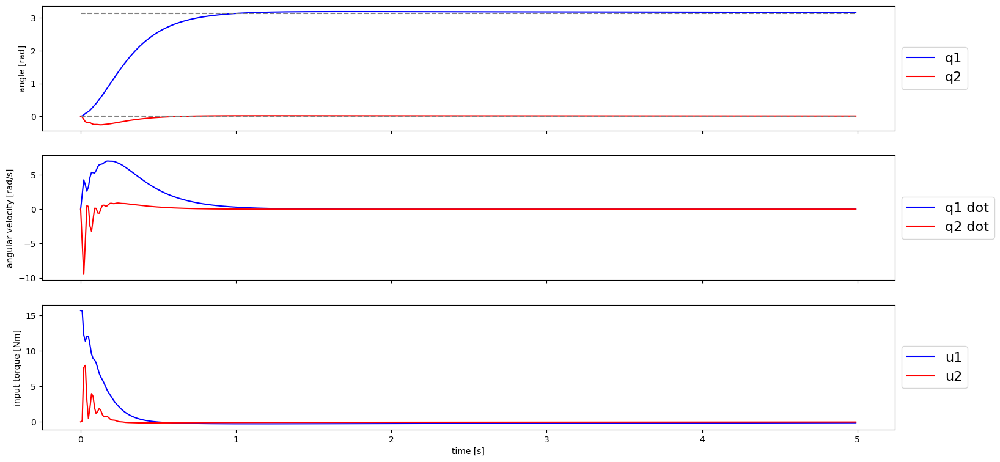

In [7]:
plot_timeseries(
    T,
    X,
    U,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[1], torque_limit[1]],
)

## Gravity Compensation

Counterbalance external forces (gravity)

$$
\tau(x) = G(q)
$$

Plug into EOM: $M(q)\ddot{q} + C(q, \dot{q})\dot{q} = 0$ $\rightarrow$ System without forces

In [9]:
from double_pendulum.controller.gravity_compensation.gravity_compensation_controller import GravityCompensationController

In [10]:
gravcomp_controller = GravityCompensationController(
    mass=[mass[0], mass[1]],
    length=length,
    com=com,
    damping=damping,
    gravity=gravity,
    inertia=inertia,
    torque_limit=torque_limit,
)

In [17]:
x0 = [np.pi / 2.0, np.pi / 4.0, 0.0, 0.0]

sim.reset()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=gravcomp_controller,
    integrator="runge_kutta",
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

In [1]:
plot_timeseries(
    T,
    X,
    U,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[1], torque_limit[1]],
)

### Think-Pair-Share (5 min)

- Try different initial states (with and without velocity, etc.)
- Try modifying the instance of GravityCompensationController. Slightly change masses, dimensions, etc. How does the controller's behavior change?

### Gravity Compensation + PID

Combine the gravity compensation controller with the PID controller

$$
\tau(x) = G(q) + K_p (q_d - q) + K_i\int_0^t (q_d - q(t')) - K_d\dot{q}
$$

With this controller, we aim to add to the gravity compensation controller so that it drives our system to the goal.

In [16]:
from double_pendulum.controller.gravity_compensation.PID_gravity_compensation_controller import PIDGravityCompensationController

In [19]:

### Type here!

Kp = 0.0
Ki = 0.0
Kd = 0.0

###

gravcompPID_controller = PIDGravityCompensationController(
    mass=mass,
    length=length,
    com=com,
    damping=damping,
    gravity=gravity,
    inertia=inertia,
    torque_limit=torque_limit,
    dt=dt,
)
gravcompPID_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)
gravcompPID_controller.set_goal(goal)

In [22]:
x0 = [0.0, 0.0, 0.0, 0.0]

sim.reset()
sim.set_desired_state(goal)

gravcompPID_controller.init()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=gravcompPID_controller,
    integrator="runge_kutta",
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

## Think-Pair-Share (5 min)

- Tune the Gravity Compensation + PID controller to get the double pendulum to swing up.
- Compare the torque with that obtained with the PID controller. How are they different? Why?

In [16]:
plot_timeseries(
    T,
    X,
    U,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[1], torque_limit[1]],
)

### 2.2 Trajectory Tracking

## Inverse Dynamics

Compute the needed torque with the system inverse dynamics

$$ \tau(q, \dot{q}, \ddot{q}) = M(q)\ddot{q} + C(q, \dot{q})\dot{q} + G(q) $$

Where $\ddot{q}$ are the desired accelerations and $q$ and $\dot{q}$ are the current positions and velocities, respectively.

In [17]:
from double_pendulum.controller.inverse_dynamics.inverse_dynamics_ff_controller import FeedforwardController

In [18]:
# simulation parameters
dt = 0.001
t_final = 5.0
integrator = "runge_kutta"
x0 = [0.0, 0.0, 0.0, 0.0]

csv_path = "trajectory_modelfree.csv"

data = pd.read_csv(csv_path)
time_traj = np.asarray(data["time"])
pos1_traj = np.asarray(data["pos1"])
pos2_traj = np.asarray(data["pos2"])
vel1_traj = np.asarray(data["vel1"])
vel2_traj = np.asarray(data["vel2"])
acc1_traj = np.asarray(data["acc1"])
acc2_traj = np.asarray(data["acc2"])

T_des = time_traj.T
X_des = np.asarray([pos1_traj, pos2_traj, vel1_traj, vel2_traj]).T
ACC_des = np.asarray([acc1_traj, acc2_traj]).T

ff_controller = FeedforwardController(
    mass=mass,
    length=length,
    com=com,
    damping=damping,
    gravity=gravity,
    inertia=inertia,
    torque_limit=torque_limit,
    csv_path=csv_path,
)

In [19]:
sim.reset()
sim.set_desired_traj(T_des, X_des)

ff_controller.init()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=ff_controller,
    integrator="runge_kutta",
    plot_inittraj=True,
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

In [20]:
acc = np.diff(np.asarray(X).T[2:, :]).T / dt
acc = np.insert(acc, 0, [0, 0], axis=0)

plot_timeseries(
    T,
    X,
    U,
    acc,
    plot_acc=True,
    plot_energy=False,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[0], torque_limit[0]],
    T_des=T_des,
    X_des=X_des,
    ACC_des=ACC_des,
)

## Think-Pair-Share (5 min)

- Why does the pendulum fall after reaching the goal position?
- Try modifying any of the values in lines 23-29 of the cell where the FeedforwardController is instantiated. How does the response of the system change?

## PID Control

Proportional-Integral-Derivative Control for following a trajectory
$$
\tau(t, x) = K_p q_e(t) + K_i \int_0^t q_e(t') \text{d}t' + K_d \dot{q}_e(t) \\
q_e(t) = q_d(t) - q(t)
$$

In [21]:
from double_pendulum.controller.pid.trajectory_pid_controller import TrajPIDController

In [22]:
# trajectory
#csv_path = "trajectory_modelfree.csv"
csv_path = "trajectory_modelbased.csv"

data = pd.read_csv(csv_path)
time_traj = np.asarray(data["time"])
pos1_traj = np.asarray(data["pos1"])
pos2_traj = np.asarray(data["pos2"])
vel1_traj = np.asarray(data["vel1"])
vel2_traj = np.asarray(data["vel2"])
acc1_traj = np.asarray(data["acc1"])
acc2_traj = np.asarray(data["acc2"])

T_des = time_traj
X_des = np.asarray([pos1_traj, pos2_traj, vel1_traj, vel2_traj]).T
ACC_des = np.asarray([acc1_traj, acc2_traj]).T

# controller parameters
Kp = 10.0
Ki = 0.0
Kd = 10.0

trajPID_controller = TrajPIDController(csv_path=csv_path, dt=dt, torque_limit=torque_limit)
trajPID_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)

In [23]:
sim.reset()
sim.set_desired_traj(T_des, X_des)

trajPID_controller.init()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=trajPID_controller,
    integrator="runge_kutta",
    plot_inittraj=True,
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

In [24]:
acc = np.diff(np.asarray(X).T[2:, :]).T / dt
acc = np.insert(acc, 0, [0, 0], axis=0)

plot_timeseries(
    T,
    X,
    U,
    acc,
    plot_acc=True,
    plot_energy=False,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[0], torque_limit[0]],
    T_des=T_des,
    X_des=X_des,
    ACC_des=ACC_des,
)

## Computed Torque

A combination of feedforward and PID

$$
\tau(t, x) = M(q(t))\left( \ddot{q}_d(t) + K_p q_e(t) + K_i \int_0^t q_e(t') \text{d}t' + K_d \dot{q}_e(t) \right) + C(q(t), \dot{q}(t))\dot{q}(t) + G(q(t))
$$

- PID control is plugged in on the acceleration level. PID control signal is added to the desired acceleration $\ddot{q}_d$

In [25]:
from double_pendulum.controller.inverse_dynamics.computed_torque_controller import ComputedTorqueController

In [26]:
### Type here!

Kp = 0.0
Ki = 0.0
Kd = 0.0

###

csv_path = "trajectory_modelbased.csv"

data = pd.read_csv(csv_path)
time_traj = np.asarray(data["time"])
pos1_traj = np.asarray(data["pos1"])
pos2_traj = np.asarray(data["pos2"])
vel1_traj = np.asarray(data["vel1"])
vel2_traj = np.asarray(data["vel2"])
acc1_traj = np.asarray(data["acc1"])
acc2_traj = np.asarray(data["acc2"])

T_des = time_traj.T
X_des = np.asarray([pos1_traj, pos2_traj, vel1_traj, vel2_traj]).T
ACC_des = np.asarray([acc1_traj, acc2_traj]).T

ctg_controller = ComputedTorqueController(
    mass=mass,
    length=length,
    com=com,
    damping=damping,
    gravity=gravity,
    inertia=inertia,
    torque_limit=torque_limit,
    dt=dt,
    csv_path=csv_path,
)

ctg_controller.set_parameters(Kp=Kp, Ki=Ki, Kd=Kd)

In [27]:
sim.reset()
sim.set_desired_traj(T_des, X_des)

ctg_controller.init()
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=t_final,
    dt=dt,
    controller=ctg_controller,
    integrator="runge_kutta",
    plot_inittraj=True,
)

html = HTML(anim.to_jshtml())
display(html)
plt.close()

In [28]:
acc = np.diff(np.asarray(X).T[2:, :]).T / dt
acc = np.insert(acc, 0, [0, 0], axis=0)

plot_timeseries(
    T,
    X,
    U,
    acc,
    plot_acc=True,
    plot_energy=False,
    pos_y_lines=[0.0, np.pi],
    tau_y_lines=[-torque_limit[0], torque_limit[0]],
    T_des=T_des,
    X_des=X_des,
    ACC_des=ACC_des,
)

### Think-Pair-Share (5 min)
- Tune the Computed torque controller.
- Compare the torque with that obtained with the PID controller. How are they different?